In [60]:
from PIL import Image
import numpy as np
import pandas as pd

import sklearn as sk
from sklearn import cluster
from sklearn import linear_model
from scipy.optimize import minimize

from sklearn.cluster import KMeans

import itertools
import os
from itertools import cycle

import scipy.stats as stats
from scipy.misc import factorial

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab

import bisect 

import time
import pylab as pl
from IPython import display

import copy

import seaborn as sns

import cv2
import statsmodels.api as sm

%matplotlib inline

sns.set_style('whitegrid')
sns.set_context('poster')

# Look for user Actions

In [61]:
threshold = 15  # 15 pixles out of place
                # A log roughlt corresponds to 25 pixles

In [62]:
y_max = 1080 - 864
x_max = 384

def load_image( infilename ) :
    img = Image.open(infilename)
    img.load()
    data = np.asarray( img, dtype="int32" )
    return data

def save_image( npdata, outfilename ) :
    img = Image.fromarray( np.asarray( np.clip(npdata,0,255), dtype="uint8"), "L" )
    img.save( outfilename )

In [63]:
def extract_boundary(original,hsv_image, lower, upper, flag):
    # need end points of the boundary too
    mask = cv2.inRange(hsv_image, lower, upper)
    # Bitwise-AND mask and original image
    res = cv2.bitwise_and(original,original,mask= mask)
    #boundaries in gray scale
    gray = cv2.cvtColor(res,cv2.COLOR_BGR2GRAY)
    # Otsu's thresholding and gaussian filtering  to make the logs white and the background black for better detection
    ret2,th2 = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    # Otsu's thresholding after Gaussian filtering
    blur = cv2.GaussianBlur(gray,(5,5),0)
    #logs will be white in th3
    ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    if(flag==1):
        black, extLeft, extRight, cx,cy = find_contour(th3,original)
        return black,extLeft,extRight,cx,cy
    return th3   

#just identify water flow path for drawing graphs   
def detect_water(min_video_frame):
    hsv = cv2.cvtColor(min_video_frame, cv2.COLOR_BGR2HSV)
    # define range of green/yellow color in HSV
    lower_green = np.array([29,86,6])
    upper_green = np.array([64,255,255])
    th3 = extract_boundary(min_video_frame,hsv,lower_green, upper_green,0)    
    store = th3
    # morphing to get the skeletal structure/ medial line of the water flow    
    size = np.size(th3)    
    skel = np.zeros(th3.shape,np.uint8)    
    element = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
    done = False
 
    while(not done):
        eroded = cv2.erode(th3,element)
        temp = cv2.dilate(eroded,element)
        temp = cv2.subtract(th3,temp)
        skel = cv2.bitwise_or(skel,temp)
        th3 = eroded.copy()
 
        zeros = size - cv2.countNonZero(th3)
        if zeros==size:
            done = True
    return store,skel

def detect_logs(min_video_frame):
    hsv = cv2.cvtColor(min_video_frame, cv2.COLOR_BGR2HSV)
    # define range of blue color in HSV
    lower_blue = np.array([110,50,50])
    upper_blue = np.array([130,255,255])  
    
    th3 = extract_boundary(min_video_frame,hsv,lower_blue, upper_blue,0)    

    #smooth the logs (current version very fat lines)
    image ,contours, heirarchy = cv2.findContours(th3,1,2)#cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    
#     print(contours)
    
    #Draw log contour + bonding rects
    colored = cv2.cvtColor(image,cv2.COLOR_GRAY2BGR) 
    count =0    
    black = np.zeros(colored.shape)

    return image,[]

#### 09-19 23min game from Andee/Nick/Aditi/Leilah session with CW

In [64]:
cap = cv2.VideoCapture('./2017-09-19T10_01_14-0.mov')
count = 0

logs_minus1 = []
diffs = []
iter_num = 0
images = []
i = 0

while cap.isOpened():
    i+=1
    if i < 6:
        continue
    ret,frame = cap.read()
    
    if ret==True:
        logs,centers = detect_logs(frame[864:1080,0:384])
        logs = logs / 255 # get a 0 or a 1
        if len(logs_minus1) <= 0:
            logs_minus1 = logs
            
        diff = np.linalg.norm(logs_minus1 - logs)
        if diff > threshold:
            diffs.append(iter_num)
            images.append(frame[864:1080,0:384])
            
        logs_minus1 = logs
        iter_num += 1
    else:
        cap.set(1, count-1)
        print("something not working")
        cv2.waitKey(1000)
    if cv2.waitKey(10) == 27:
        break
    if cap.get(1) == cap.get(7):
        break
    if count >= 20:
        break
        
cap.release()

In [65]:
print("There are {number_changes} in the file, each occured at:\n{change_points}".format(
    number_changes = len(diffs),
    change_points = ["%0.2f"%(d/60) for d in diffs]))

There are 136 in the file, each occured at:
['0.10', '0.13', '0.45', '0.48', '0.52', '0.53', '0.55', '0.58', '0.60', '0.62', '0.63', '0.65', '0.67', '0.68', '0.70', '0.72', '0.73', '0.75', '0.77', '0.78', '0.80', '0.82', '0.88', '0.90', '0.93', '0.95', '0.97', '0.98', '1.00', '1.03', '1.13', '1.33', '1.48', '1.75', '1.77', '1.85', '1.90', '2.07', '2.32', '2.33', '2.35', '2.37', '2.38', '2.40', '2.50', '2.52', '2.65', '2.68', '2.73', '4.97', '5.00', '5.02', '5.03', '5.05', '5.15', '5.22', '5.23', '5.52', '5.55', '5.57', '5.58', '5.62', '5.65', '5.70', '6.18', '6.27', '6.28', '6.30', '6.32', '6.33', '6.38', '6.80', '6.85', '6.87', '6.92', '6.93', '7.57', '7.58', '7.60', '7.62', '7.63', '7.78', '7.82', '8.25', '8.27', '8.45', '8.47', '8.70', '8.72', '8.80', '8.85', '10.42', '11.68', '11.98', '12.00', '12.02', '12.03', '12.07', '12.13', '12.17', '12.25', '12.27', '12.28', '12.47', '12.48', '12.67', '12.68', '12.70', '12.73', '13.20', '13.27', '13.33', '13.35', '13.37', '13.38', '13.40', '1

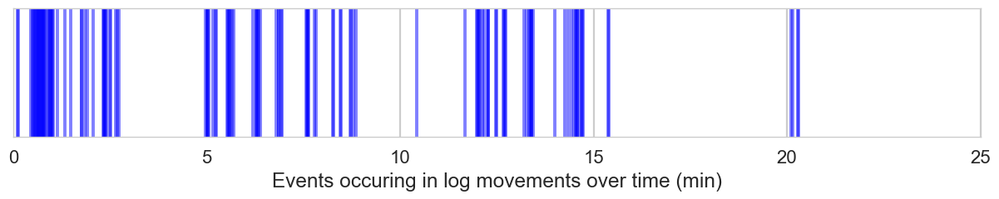

In [66]:
fig, ax = plt.subplots(1,1, figsize=(15,2))
data_diffs = {}

for i in diffs:
    ax.axvline(x=i/60, alpha=0.5)
    ax.yaxis.set_visible(False)
    ax.set_xlabel('Events occuring in log movements over time (min)')

data_diffs['df_1'] = diffs
plt.show()

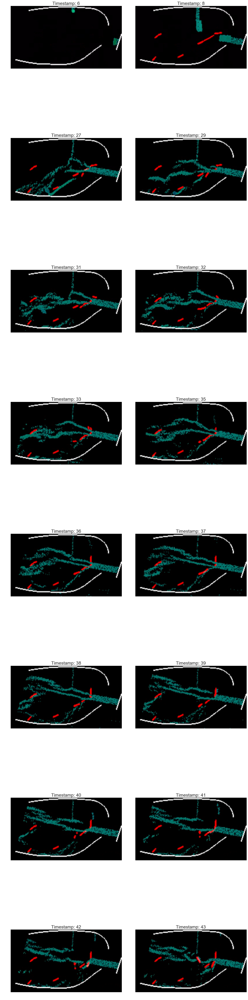

In [67]:
num_rows=min(len(diffs)//2, 8)

fig, axes = plt.subplots(num_rows, 2, figsize=(15, 8*num_rows))
axes = axes.flatten()

for i, ax in enumerate(axes):
    
    ax.set_title('Timestamp: %i'%diffs[i])
    ax.imshow(images[i])
    ax.set_axis_off()

fig.tight_layout()
plt.show()

#### 09-09 1h15 game

In [68]:
cap = cv2.VideoCapture('./2017-09-09T12_08_00-0.mov')
count = 0
log_centers = []
mu, cov = None, None
logs_minus1 = []
diffs = []
iter_num = 0

images = []

while cap.isOpened():
    ret,frame = cap.read()
    
    if ret==True:
#         store, skel = detect_water(frame[864:1080,0:384])
        logs,centers = detect_logs(frame[864:1080,0:384])
        
        logs = logs / 255 # get a 0 or a 1

        if len(logs_minus1) <= 0:
            logs_minus1 = logs
            
        diff = np.linalg.norm(logs_minus1 - logs)
#         print(diff)
        if diff > threshold:
            diffs.append(iter_num)
            images.append(frame[864:1080,0:384])
            
#         plt.imshow(logs)
        logs_minus1 = logs
        iter_num += 1
        
#         cv2.imwrite("frames/frame_log%04d.jpg" % count, logs)
#         count = count + 1
#         log_centers.append(centers)
    else:
        # The next frame is not ready, so we try to read it again
        cap.set(1, count-1)
        print("something not working")
        # It is better to wait for a while for the next frame to be ready
        cv2.waitKey(1000)

    if cv2.waitKey(10) == 27:
        break
    if cap.get(1) == cap.get(7):
        # If the number of captured frames is equal to the total number of frames,
        # we stop
        break
    if count >= 20:
        break
        
cap.release()

In [69]:
print("There are {number_changes} in the file, each occured at:\n{change_points}".format(
    number_changes = len(diffs),
    change_points = ["%0.2f"%(d/60) for d in diffs]))

There are 2016 in the file, each occured at:
['0.10', '0.12', '0.13', '0.30', '0.32', '0.33', '0.35', '0.37', '0.38', '0.40', '0.57', '0.58', '0.60', '0.62', '0.63', '0.67', '0.70', '0.92', '0.95', '0.97', '1.02', '1.08', '1.12', '1.13', '1.18', '1.28', '1.32', '1.42', '1.80', '1.83', '1.85', '1.87', '1.88', '1.90', '1.92', '2.18', '2.20', '2.22', '2.65', '3.70', '3.72', '3.73', '3.75', '3.78', '3.80', '3.87', '3.88', '4.10', '4.12', '4.48', '4.50', '4.60', '5.30', '6.53', '8.38', '8.40', '8.42', '8.97', '8.98', '9.08', '9.35', '9.38', '9.55', '9.75', '9.78', '9.80', '9.98', '10.08', '10.12', '10.13', '10.15', '10.17', '11.20', '11.23', '11.25', '12.43', '13.05', '13.30', '14.37', '14.90', '15.42', '16.28', '16.30', '16.32', '16.33', '17.90', '17.92', '18.00', '18.37', '18.40', '18.43', '18.45', '18.47', '18.50', '18.52', '18.53', '18.55', '18.57', '18.58', '18.60', '18.62', '18.63', '18.65', '18.68', '18.72', '18.75', '18.77', '18.78', '18.80', '18.82', '18.83', '18.85', '18.87', '18.

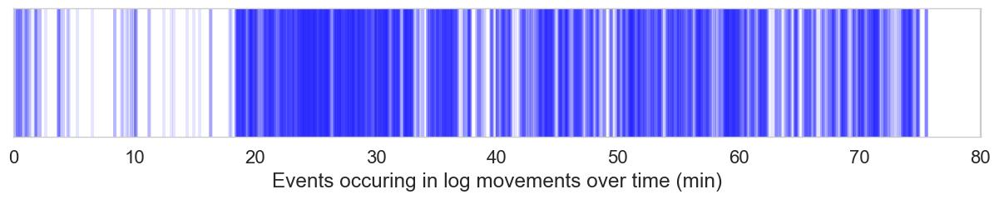

In [70]:
fig, ax = plt.subplots(1,1, figsize=(15,2))

for i in diffs:
    ax.axvline(x=i/60, alpha=0.1)
    ax.yaxis.set_visible(False)
    ax.set_xlabel('Events occuring in log movements over time (min)')

data_diffs['df_2'] = diffs
plt.show()

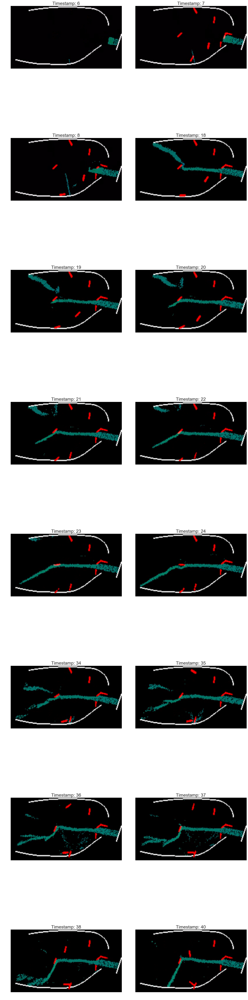

In [71]:
num_rows=min(len(diffs)//2, 8)

fig, axes = plt.subplots(num_rows, 2, figsize=(15, 8*num_rows))
axes = axes.flatten()

for i, ax in enumerate(axes):
    
    ax.set_title('Timestamp: %i'%diffs[i])
    ax.imshow(images[i])
    ax.set_axis_off()

fig.tight_layout()
plt.show()

### 10_13 Teacher Prototype Game

In [72]:
cap = cv2.VideoCapture('./2017-09-01T13_16_45-2.mov')
count = 0

logs_minus1 = []
diffs = []
iter_num = 0

images = []
i = 0

while cap.isOpened():
    i+=1
    if i < 6:
        continue
    ret,frame = cap.read()
    
    if ret==True:
        logs,centers = detect_logs(frame[864:1080,0:384])
        logs = logs / 255 # get a 0 or a 1
        if len(logs_minus1) <= 0:
            logs_minus1 = logs
            
        diff = np.linalg.norm(logs_minus1 - logs)
        if diff > threshold:
            diffs.append(iter_num)
            images.append(frame[864:1080,0:384])
            
        logs_minus1 = logs
        iter_num += 1
    else:
        cap.set(1, count-1)
        print("something not working")
        cv2.waitKey(1000)
    if cv2.waitKey(10) == 27:
        break
    if cap.get(1) == cap.get(7):
        break
    if count >= 20:
        break
        
cap.release()

In [73]:
print("There are {number_changes} in the file, each occured at:\n{change_points}".format(
    number_changes = len(diffs),
    change_points = ["%0.2f"%(d/60) for d in diffs]))

There are 309 in the file, each occured at:
['0.02', '0.13', '0.15', '0.17', '0.22', '0.23', '0.27', '0.30', '0.32', '0.33', '0.35', '0.45', '0.47', '0.48', '0.50', '0.52', '0.53', '0.55', '0.57', '0.58', '0.60', '0.62', '0.65', '0.67', '0.70', '0.72', '0.73', '0.75', '0.80', '0.82', '0.85', '0.88', '0.90', '0.95', '0.97', '1.12', '1.13', '1.15', '1.17', '1.23', '1.25', '1.27', '1.30', '1.32', '1.33', '1.35', '1.42', '1.43', '1.45', '1.53', '1.55', '1.58', '1.62', '1.63', '1.65', '1.68', '1.70', '1.72', '1.73', '1.75', '1.77', '1.87', '1.88', '1.92', '1.93', '1.95', '1.98', '2.00', '2.08', '2.10', '2.15', '2.17', '2.18', '2.22', '2.23', '2.25', '2.27', '2.30', '2.38', '2.40', '2.42', '2.45', '2.47', '2.52', '2.63', '2.73', '2.75', '2.78', '2.82', '2.87', '2.88', '2.90', '2.92', '2.93', '2.95', '2.97', '2.98', '3.00', '3.02', '3.05', '3.07', '3.08', '3.10', '3.12', '3.13', '3.15', '3.17', '3.18', '3.22', '3.25', '3.27', '3.28', '3.30', '3.47', '3.58', '3.72', '3.93', '3.97', '3.98', '4.

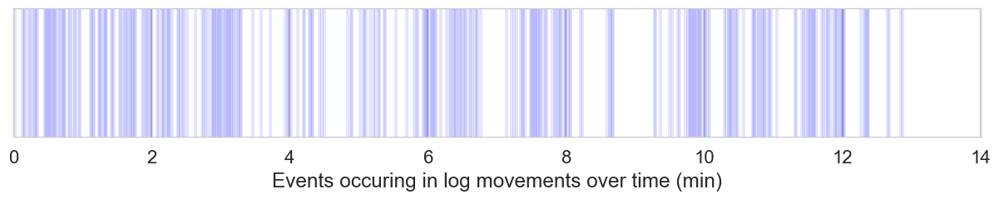

In [74]:
fig, ax = plt.subplots(1,1, figsize=(15,2))

for i in diffs:
    ax.axvline(x=i/60, alpha=0.1)
    ax.yaxis.set_visible(False)
    ax.set_xlabel('Events occuring in log movements over time (min)')

data_diffs['df_3'] = diffs
plt.show()

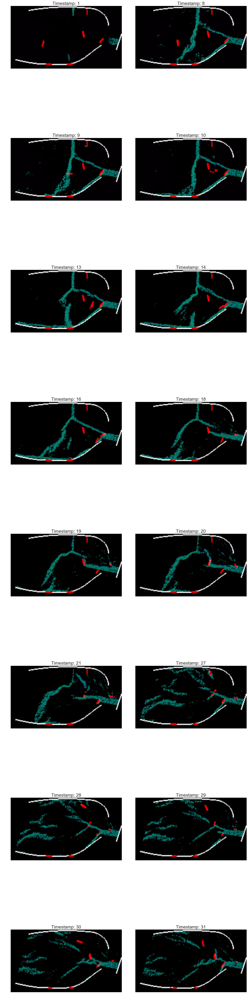

In [75]:
num_rows=min(len(diffs)//2, 8)

fig, axes = plt.subplots(num_rows, 2, figsize=(15, 8*num_rows))
axes = axes.flatten()

for i, ax in enumerate(axes):
    
    ax.set_title('Timestamp: %i'%diffs[i])
    ax.imshow(images[i])
    ax.set_axis_off()

fig.tight_layout()
plt.show()

#### 09-06 - example of no events

In [76]:
cap = cv2.VideoCapture('./2017-09-06T09_35_14-1.mov')
count = 0

logs_minus1 = []
diffs = []
iter_num = 0

images = []
i = 0

while cap.isOpened():
    i+=1
    if i < 6:
        continue
    ret,frame = cap.read()
    
    if ret==True:
        logs,centers = detect_logs(frame[864:1080,0:384])
        logs = logs / 255 # get a 0 or a 1
        if len(logs_minus1) <= 0:
            logs_minus1 = logs
            
        diff = np.linalg.norm(logs_minus1 - logs)
        if diff > threshold:
            diffs.append(iter_num)
            images.append(frame[864:1080,0:384])
            
        logs_minus1 = logs
        iter_num += 1
    else:
        cap.set(1, count-1)
        print("something not working")
        cv2.waitKey(1000)
    if cv2.waitKey(10) == 27:
        break
    if cap.get(1) == cap.get(7):
        break
    if count >= 20:
        break
        
cap.release()

In [77]:
print("There are {number_changes} in the file, each occured at:\n{change_points}".format(
    number_changes = len(diffs),
    change_points = ["%0.2f"%(d/60) for d in diffs]))

data_diffs['df_4'] = diffs

There are 0 in the file, each occured at:
[]


## Now have a look at the CSV files

In [20]:
data_csvs = {}
data_csvs['df_1'] = pd.read_csv("./2017-09-19T10_01_14-0.csv").ix[6:]
data_csvs['df_2'] = pd.read_csv("./2017-09-09T12_08_00-0.csv").ix[6:]
data_csvs['df_3'] = pd.read_csv("./2017-09-01T13_16_45-2.csv").ix[6:]
data_csvs['df_4'] = pd.read_csv("./2017-09-06T09_35_14-1.csv").ix[6:]

for k,v in data_csvs.items():
    data_csvs[k].columns = v.columns.str.strip()

data_csvs['df_1'].head(2)

,Timestamp,Time_Remaining,Total_Water,Total_Alive_Trees,Total_Dead_Trees,Total_Creatures,Desert_Water,MountainValley_Water,Plains_Water,Waterfall_Water,...,MountainValley_PlantIndex,MountainValley_CreatureIndex,Plains_PlantIndex,Plains_CreatureIndex,Jungle_PlantIndex,Jungle_CreatureIndex,Reservoir_PlantIndex,Reservoir_CreatureIndex,Wetlands_PlantIndex,Wetlands_CreatureIndex
6,2017-09-19-10-01-20,23:59:54,2.5,0,0,3,0.0,0.080558,0.0,1.96128,...,,T5Q1,,,,,,T20Q10-T21Q30-T23Q2,,T28Q1
7,2017-09-19-10-01-21,23:59:53,2.5,0,0,3,0.0,0.075844,0.0,1.95348,...,,T5Q1,,,,,,T20Q12-T21Q60-T23Q2,,T28Q1


In [21]:
data_csvs['df_1'].columns

Index(['Timestamp', 'Time_Remaining', 'Total_Water', 'Total_Alive_Trees',
       'Total_Dead_Trees', 'Total_Creatures', 'Desert_Water',
       'MountainValley_Water', 'Plains_Water', 'Waterfall_Water',
       'Floor_Water', 'Jungle_Water', 'Reservoir_Water', 'Wetlands_Water',
       'Desert_Clouds', 'MountainValley_Clouds', 'Plains_Clouds',
       'Waterfall_Clouds', 'Jungle_Clouds', 'Reservoir_Clouds',
       'Wetlands_Clouds', 'Desert_Creatures', 'MountainValley_Creatures',
       'Plains_Creatures', 'Jungle_Creatures', 'Reservoir_Creatures',
       'Wetlands_Creatures', 'Desert_lv1', 'Desert_lv2', 'Desert_lv3',
       'Desert_lv4', 'Plains_lv1', 'Plains_lv2', 'Plains_lv3', 'Plains_lv4',
       'Jungle_lv1', 'Jungle_lv2', 'Jungle_lv3', 'Jungle_lv4', 'Wetlands_lv1',
       'Wetlands_lv2', 'Wetlands_lv3', 'Wetlands_lv4', 'Desert_Dead_lv1',
       'Desert_Dead_lv2', 'Desert_Dead_lv3', 'Desert_Dead_lv4',
       'Desert_Balance', 'Plains_Dead_lv1', 'Plains_Dead_lv2',
       'Plains_Dead_l

In [22]:
water_columns = ['Desert_Water', 'Plains_Water', 'Wetlands_Water', 'Jungle_Water', 'Reservoir_Water', 'MountainValley_Water', 
                 'Waterfall_Water', 'Floor_Water']

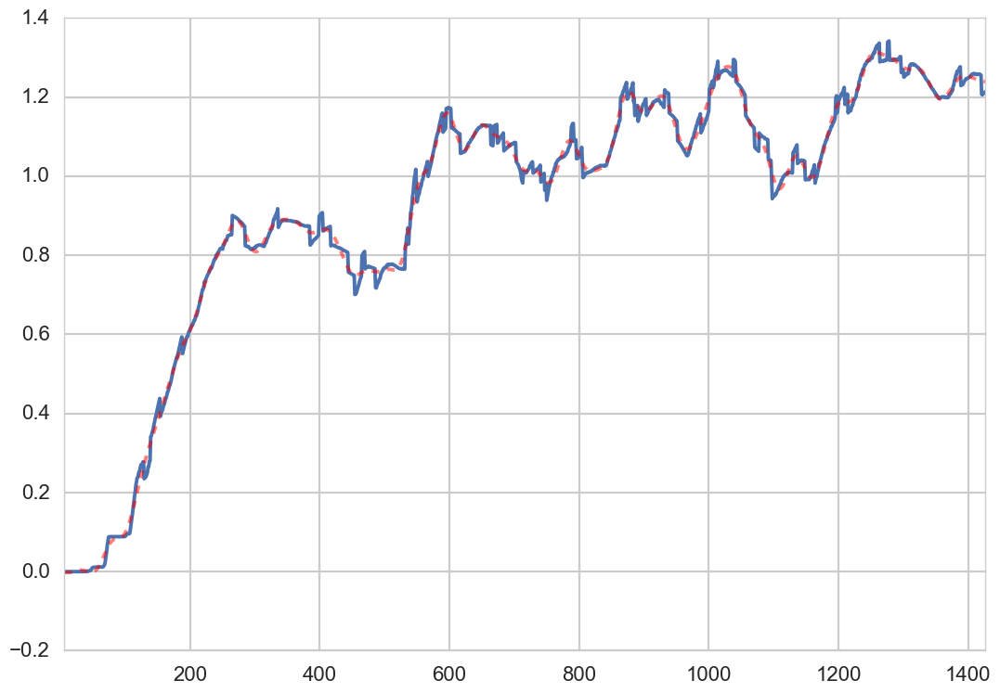

In [23]:
import scipy
from scipy.signal import butter, filtfilt

time_series = data_csvs['df_1'][water_columns[1]]
b,a = butter(10, 0.05, btype='low')

time_series.plot()
plt.plot(time_series.index.values, filtfilt(b, a, time_series), 'r--', alpha=0.5)

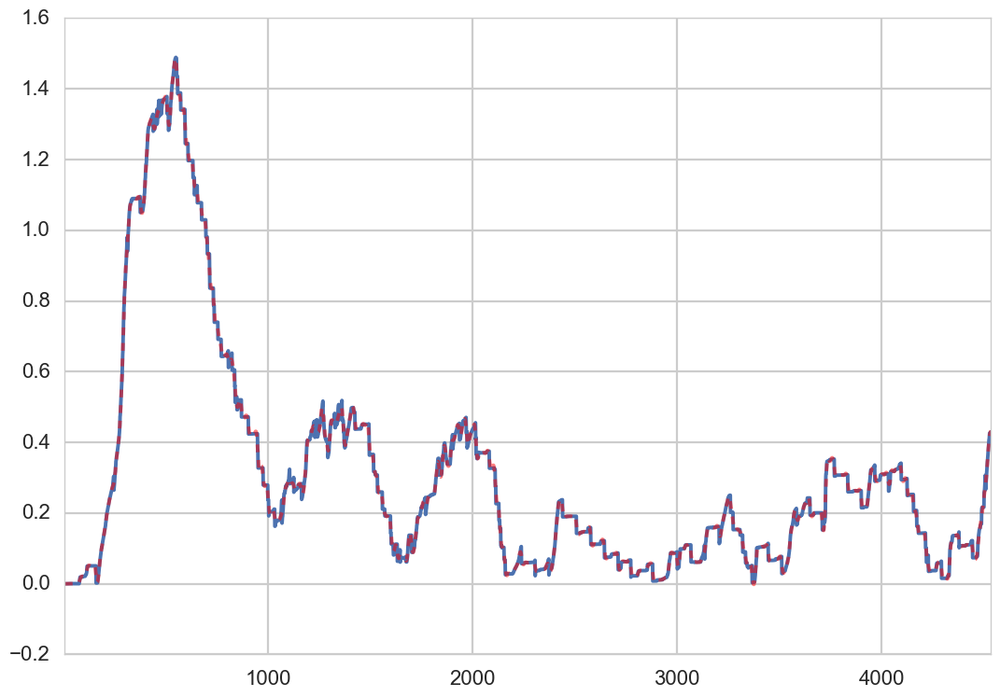

In [24]:
time_series = data_csvs['df_2'][water_columns[1]]
b,a = butter(5, 0.1, btype='low')

time_series.plot()
plt.plot(time_series.index.values, filtfilt(b, a, time_series), 'r--', alpha=0.5)

In [25]:
signal_data = {}

for k,v in data_csvs.items():
    
    signal_data[k] = {}
    signal_data[k]['index'] = v.index.values


for i, tsname in enumerate(water_columns):
    
    for k,v in signal_data.items():
        
        signal_data[k][tsname] = filtfilt(b, a, data_csvs[k][water_columns[i]])

Let's perform stepwise greedy selection to choose the best wavelets

In [26]:
def construct_x_matrix(best_splits, stop):
    start = 0

    for i,split in enumerate(best_splits):

        next_part = np.arange(start, split, 1)
        constant = np.ones_like(next_part)

        if i == 0:

            X = np.concatenate([
                np.concatenate([constant, np.zeros(stop - split)]).reshape(-1,1),
                np.concatenate([next_part, np.zeros(stop - split)]).reshape(-1,1)], axis=1)
            start = split
            continue

        X = np.concatenate([
                X,
                np.concatenate([np.zeros(start), constant, np.zeros(stop - split)]).reshape(-1,1),
                np.concatenate([np.zeros(start), next_part, np.zeros(stop - split)]).reshape(-1,1),
            ], axis=1)

        start = split
    return X

# Exploration to get working code

In [27]:
step_size = 2

# start with the entire dataset
time_series = signal_data['df_1']['Plains_Water']
start, stop = 0, len(time_series)
best_splits = [stop]
best_bics = []
store_best_splits = []

for i in range(25):
    # naive approach is to iterate through at window size
    bics = []
    splits = list(range(start+step_size, stop, step_size))
    for i in splits:

        temp_splits = copy.deepcopy(best_splits)
        bisect.insort(temp_splits, i)

        X = construct_x_matrix(temp_splits, stop)
        y = time_series
        result = sm.OLS(endog=y, exog=X).fit()
        bics.append(result.bic)


    arg_best_bic = np.argmin(bics)
    best_split = splits[arg_best_bic]
    bisect.insort(best_splits, best_split)
    best_bics.append(bics[arg_best_bic])
    store_best_splits.append(copy.deepcopy(best_splits))

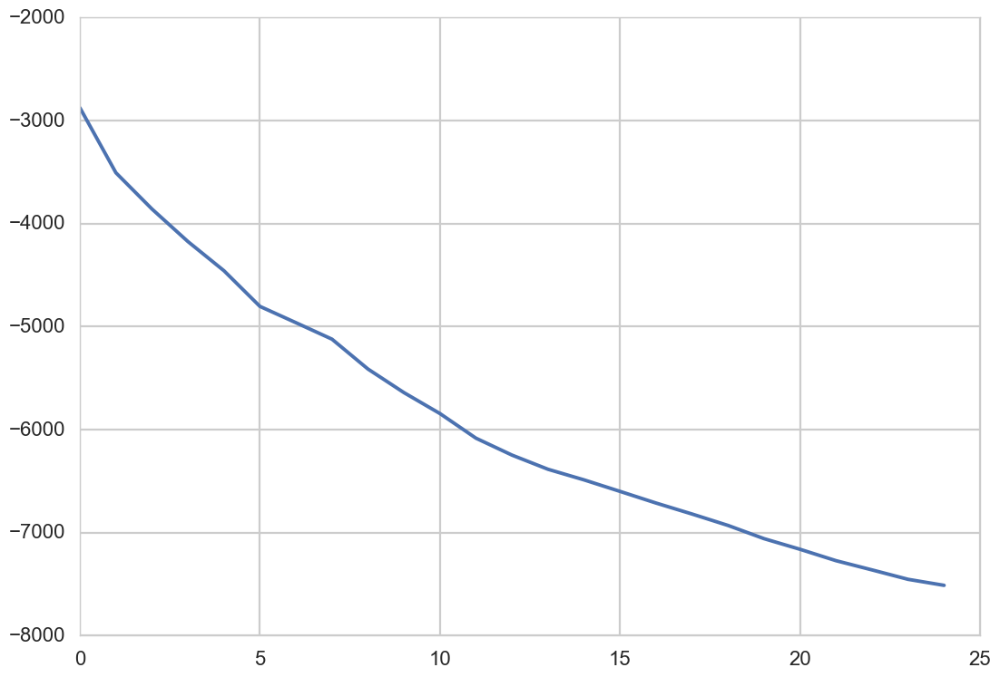

In [28]:
plt.plot(best_bics)

In [29]:
#     first_part = np.arange(start, best_split, 1)
#     second_part = np.arange(best_split, stop, 1)

#     X = np.concatenate([
#             np.concatenate([np.ones_like(first_part), np.zeros_like(second_part)]).reshape(-1,1),
#             np.concatenate([first_part, np.zeros_like(second_part)]).reshape(-1,1),
#             np.concatenate([np.zeros_like(first_part), np.ones_like(second_part)]).reshape(-1,1),
#             np.concatenate([np.zeros_like(first_part), second_part]).reshape(-1,1)
#         ], axis=1)
# result = sm.OLS(endog=y, exog=X).fit()

# I am trying to select the next best split based on the p-values but
# it might make more sense to just make a split based on the length of the 
# training data

# column_to_break = np.argmax((X[::2] > 0).sum())
# column_to_break = np.argmax(result.pvalues[::2] / (X[::2] > 0).sum())
# column_to_break

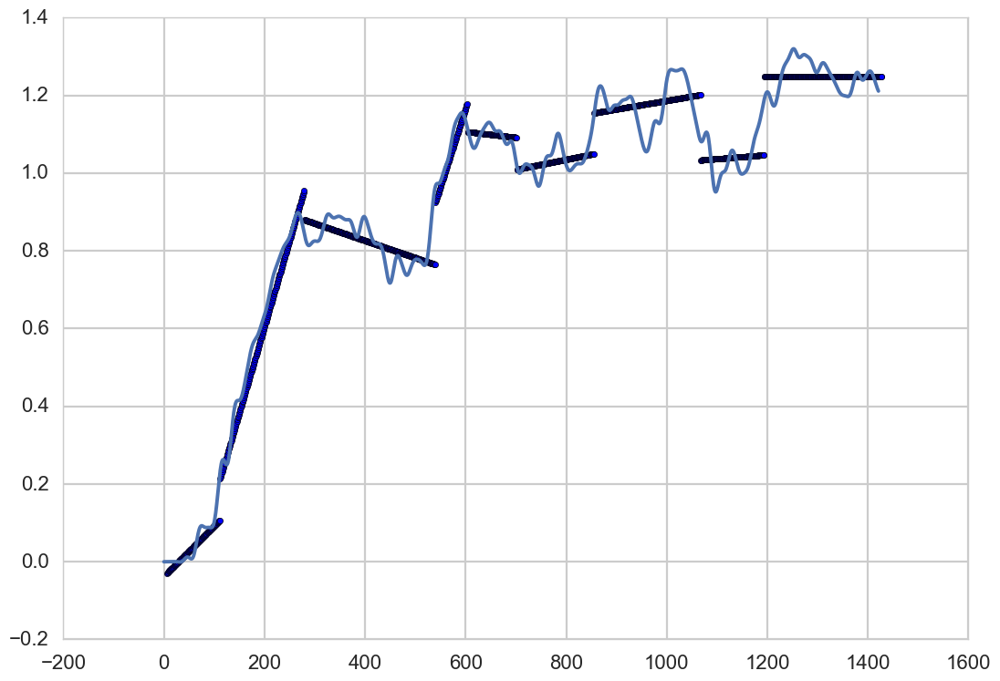

In [30]:
X = construct_x_matrix(store_best_splits[7], len(signal_data['df_1']['index']))
result = sm.OLS(endog=y, exog=X).fit()

index = signal_data['df_1']['index']
plt.scatter(index, result.predict())
plt.plot(time_series)
plt.show()

# Explore df1 to get bics at different number of breaks

## DF1 - 09-19 (Nick/Aditi/Leilah/Andee session)

In [31]:
def get_best_split_points_and_plot_BICs(axes, df):
    split_points = []

    for k, ts_name in enumerate(water_columns):

        split_points.append([])

        time_series = signal_data[df][ts_name]
        y = time_series
        index = signal_data[df]['index']

        step_size = 10

        # start with the entire dataset
        start, stop = 0, len(time_series)
        best_splits = [stop]
        best_bics = []
        store_best_splits = []

        for i in range(15):
            # naive approach is to iterate through at window size
            bics = []
            splits = list(range(start+step_size, stop, step_size))
            for i in splits:

                temp_splits = copy.deepcopy(best_splits)
                bisect.insort(temp_splits, i)

                X = construct_x_matrix(temp_splits, stop)
                result = sm.OLS(endog=y, exog=X).fit()
                bics.append(result.bic)


            arg_best_bic = np.argmin(bics)
            best_split = splits[arg_best_bic]
            bisect.insort(best_splits, best_split)
            best_bics.append(bics[arg_best_bic])
            store_best_splits.append(copy.deepcopy(best_splits))

        split_points[k].append(store_best_splits)
        axes[k].plot(best_bics)
        axes[k].set_title(ts_name)

    return split_points

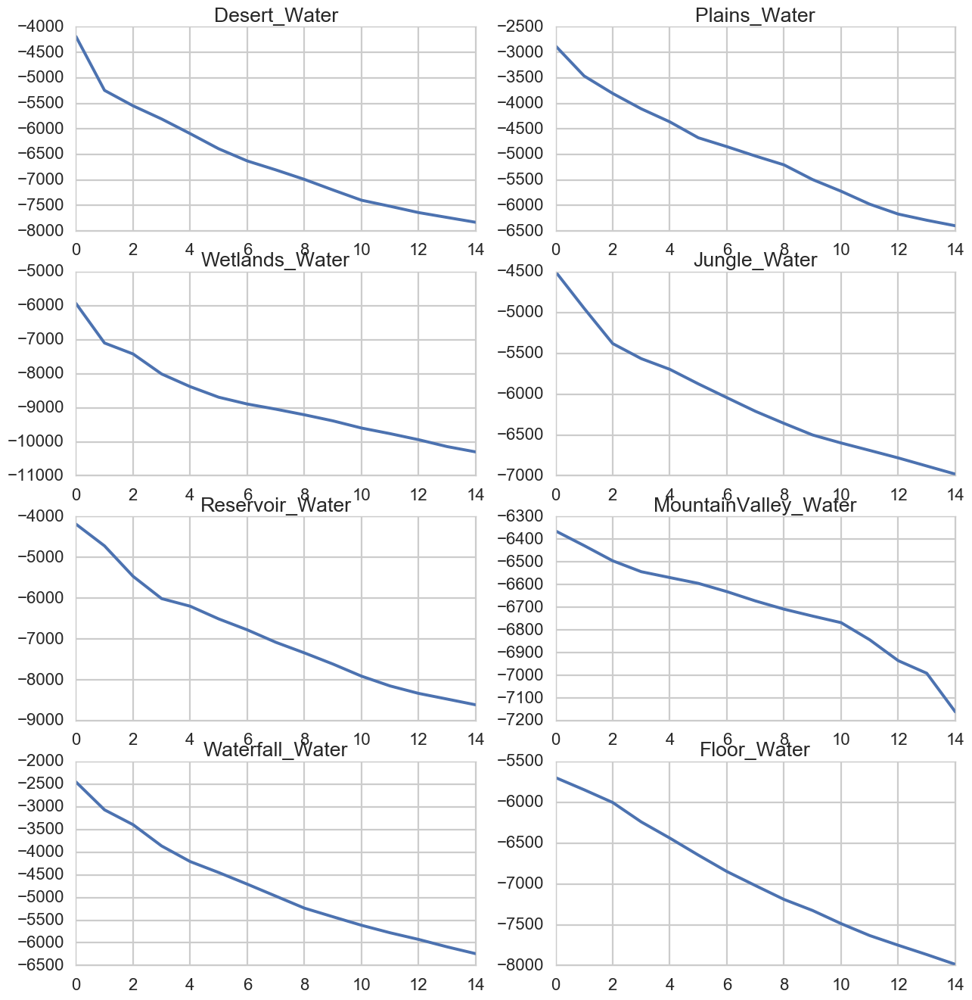

In [32]:
fig, axes = plt.subplots(4,2, figsize=(15,16))
axes = axes.flatten()

signal_data['df_1']['best_splits'] = get_best_split_points_and_plot_BICs(axes, 'df_1')

plt.show()

In [40]:
def generate_colour():
    while True:
        yield tuple(np.random.uniform(0,1,3))
    
def plot_best_splits(axes, best_individual_splitpoints, df):
    events = []

    for k, ts_name in enumerate(water_columns):

        time_series = signal_data[df][ts_name]
        y = time_series
        index = signal_data[df]['index']
        start, stop = 0, len(time_series)
        splits = signal_data[df]['best_splits'][k][0][best_individual_splitpoints[k]]
        events.append(splits)
        X = construct_x_matrix(splits, stop)

        result = sm.OLS(endog=y, exog=X).fit()
        axes[k].scatter(index/60, result.predict())
        axes[k].plot(index/60, time_series)
        axes[k].set_title(ts_name)
        axes[k].set_ylim([0,1.5])
        axes[k].set_xlim([0,np.max(index/60)])

    return events

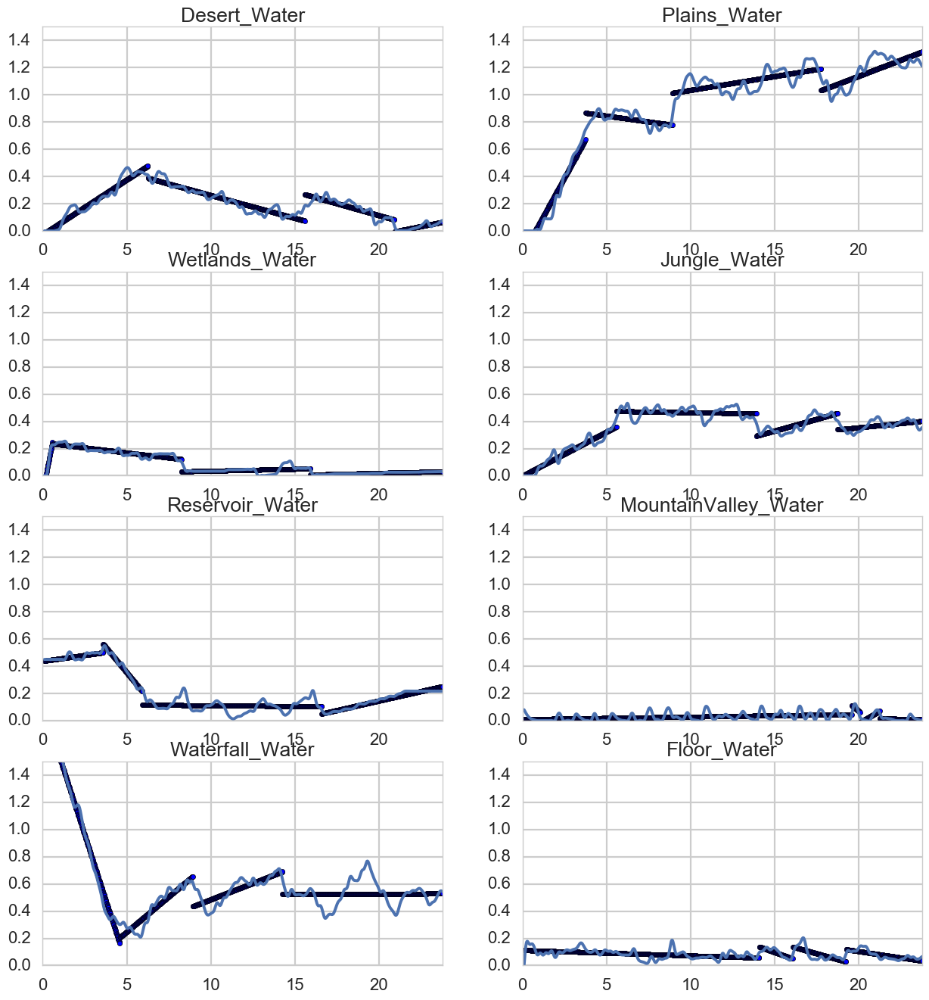

In [34]:
# best_individual_splitpoints = [
#     1, #MV
#     2, #P
#     3, #WF
#     0, #F
#     2, #R
#     1, #J
#     3, #W
#     1] #D

best_individual_splitpoints = [
    2, #MV
    2, #P
    2, #WF
    2, #F
    2, #R
    2, #J
    2, #W
    2] #D

fig, axes = plt.subplots(4,2, figsize=(15,16))
axes = axes.flatten()

events = plot_best_splits(axes, best_individual_splitpoints, 'df_1')

plt.show()

Now study the events over time to see if these match up with the observed actions from the log images.

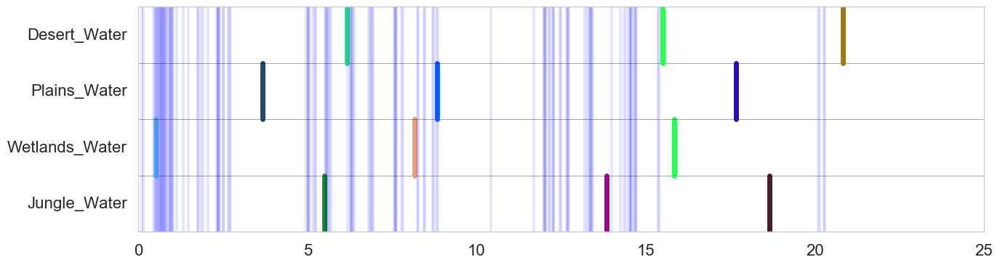

In [35]:
# flat = []
# [[flat.append(i) for i in e] for e in events]
# flat = list(np.sort(flat))
# difference = np.diff(np.sort(flat))
# c_map = generate_colour()
# colours = []

# for i, d in enumerate(difference):
#     if i == 0:
#         colours.append(next(c_map))
        
#     if d <= 20:
#         colours.append(colours[i])
        
#     else:
#         colours.append(next(c_map))
# colours
        
# fig, ax = plt.subplots(1,1, figsize=(15,9))
# i = 0

# for event_log in events[::-1]:
    
#     ax.axhline(y=i, c='black', lw=0.5, alpha=0.5)
#     for e in event_log[:-1]:
                
#         ax.axvline(x=e/60, ymin=(i+1)/(len(events)), ymax=(i)/(len(events)), c=colours[flat.index(e)], lw=5)
    
#     i += 1
    
# ax.set_ylim(0,i)
# ax.grid(False)

# ax.set_yticks(np.arange(0,len(water_columns))+0.5)
# ax.set_yticklabels(water_columns[::-1], position=(0,-1))

# for i in data_diffs['df_1']:
#     ax.axvline(x=i/60, alpha=0.1)
    
# plt.show()

focussed_events = events[-5::-1]

def generate_colour():
    while True:
        yield tuple(np.random.uniform(0,1,3))
        
flat = []
[[flat.append(i) for i in e] for e in focussed_events]
flat = list(np.sort(flat))
difference = np.diff(np.sort(flat))
c_map = generate_colour()
colours = []

for i, d in enumerate(difference):
    if i == 0:
        colours.append(next(c_map))
        
    if d <= 20:
        colours.append(colours[i])
        
    else:
        colours.append(next(c_map))
colours
        
fig, ax = plt.subplots(1,1, figsize=(15,4))
i = 0

for event_log in focussed_events:
    
    ax.axhline(y=i, c='black', lw=0.5, alpha=0.5)
    for e in event_log[:-1]:
                
        ax.axvline(x=e/60, ymin=(i+1)/(len(focussed_events)), ymax=(i)/(len(focussed_events)), c=colours[flat.index(e)], lw=5)
    
    i += 1
    
ax.set_ylim(0,i)
ax.grid(False)

ax.set_yticks(np.arange(0,len(water_columns[:4]))+0.5)
ax.set_yticklabels(water_columns[:4][::-1], position=(0,-1))

for i in data_diffs['df1']:
    ax.axvline(x=i/60, alpha=0.1)
    
plt.show()

### DF2 - 09-09

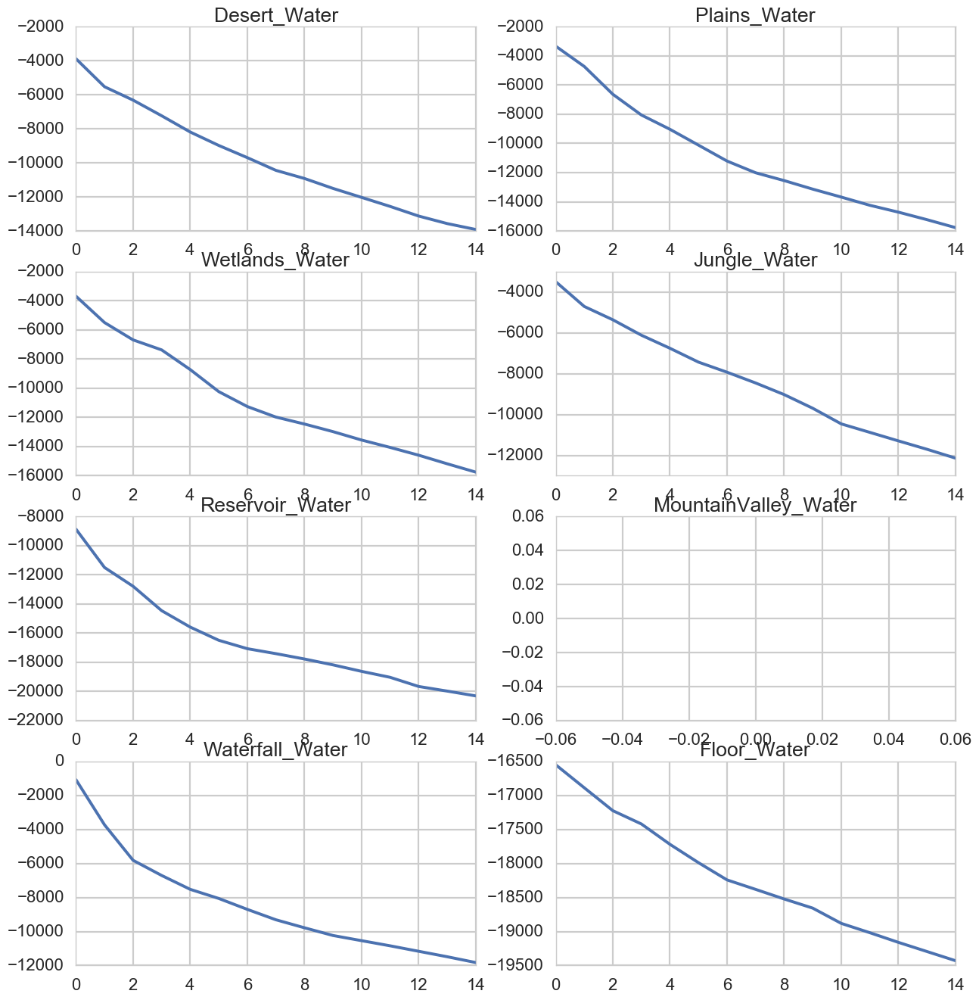

In [36]:
fig, axes = plt.subplots(4,2, figsize=(15,16))
axes = axes.flatten()

signal_data['df_2']['best_splits'] = get_best_split_points_and_plot_BICs(axes, 'df_2')

plt.show()

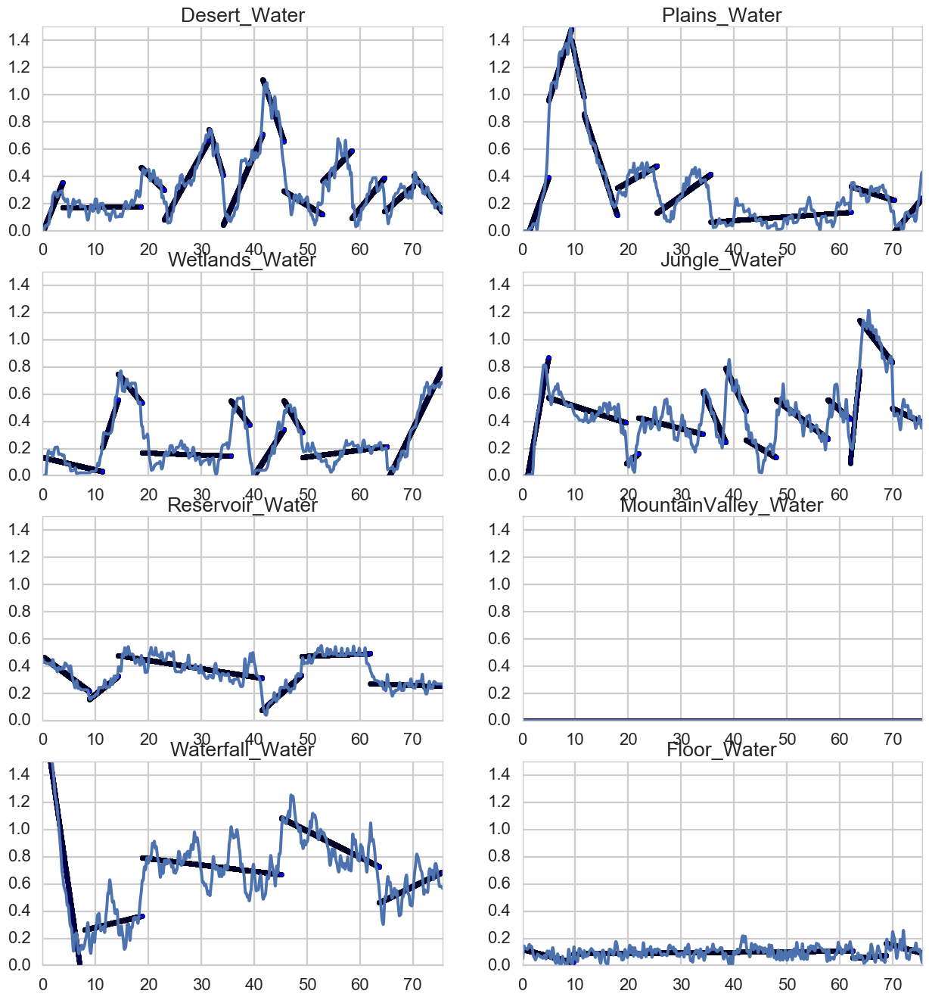

In [46]:
best_individual_splitpoints = [
    10, #D
    7, #P
    7, #W
    10, #J
    4, #R
    2, #MV
    3, #WF
    2] #F

fig, axes = plt.subplots(4,2, figsize=(15,16))
axes = axes.flatten()

events = plot_best_splits(axes, best_individual_splitpoints, 'df_2')

plt.show()

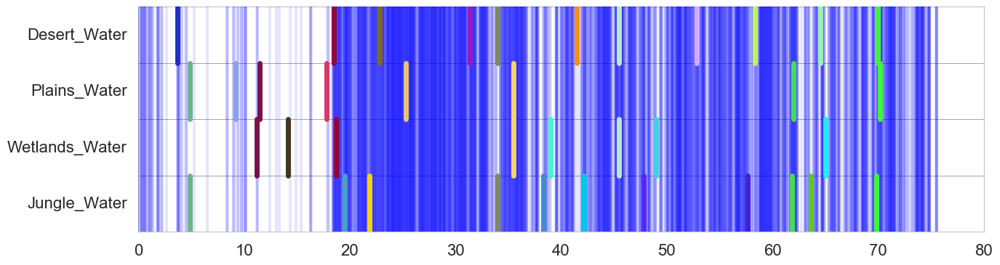

In [51]:
focussed_events = events[-5::-1]

def generate_colour():
    while True:
        yield tuple(np.random.uniform(0,1,3))
        
flat = []
[[flat.append(i) for i in e] for e in focussed_events]
flat = list(np.sort(flat))
difference = np.diff(np.sort(flat))
c_map = generate_colour()
colours = []

for i, d in enumerate(difference):
    if i == 0:
        colours.append(next(c_map))
        
    if d <= 20:
        colours.append(colours[i])
        
    else:
        colours.append(next(c_map))
colours
        
fig, ax = plt.subplots(1,1, figsize=(15,4))
i = 0

for event_log in focussed_events:
    
    ax.axhline(y=i, c='black', lw=0.5, alpha=0.5)
    for e in event_log[:-1]:
                
        ax.axvline(x=e/60, ymin=(i+1)/(len(focussed_events)), ymax=(i)/(len(focussed_events)), c=colours[flat.index(e)], lw=5,
                  zorder=100)
    
    i += 1
    
ax.set_ylim(0,i)
ax.grid(False)

ax.set_yticks(np.arange(0,len(water_columns[:4]))+0.5)
ax.set_yticklabels(water_columns[:4][::-1], position=(0,-1))

for i in data_diffs['df_2']:
    ax.axvline(x=i/60, alpha=0.1, zorder=10)
    
plt.show()

## DF3 - 09-01

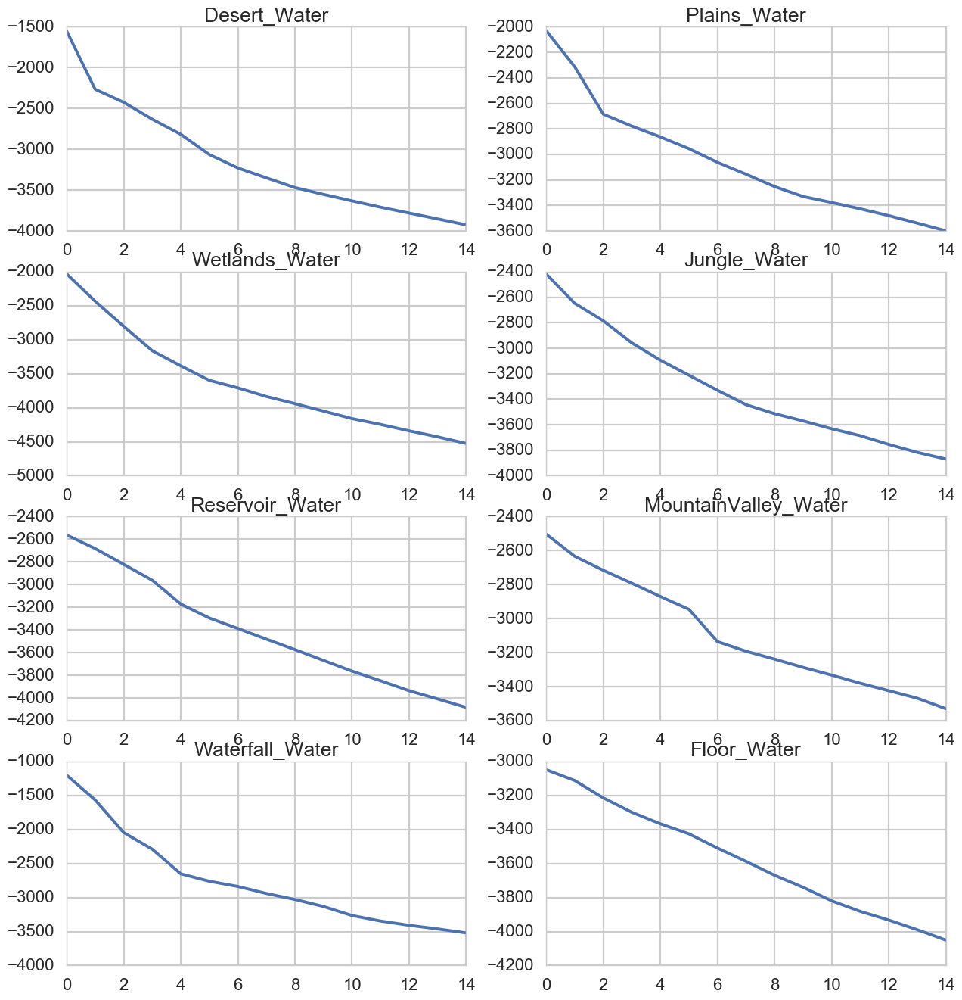

In [52]:
fig, axes = plt.subplots(4,2, figsize=(15,16))
axes = axes.flatten()

signal_data['df_3']['best_splits'] = get_best_split_points_and_plot_BICs(axes, 'df_3')

plt.show()

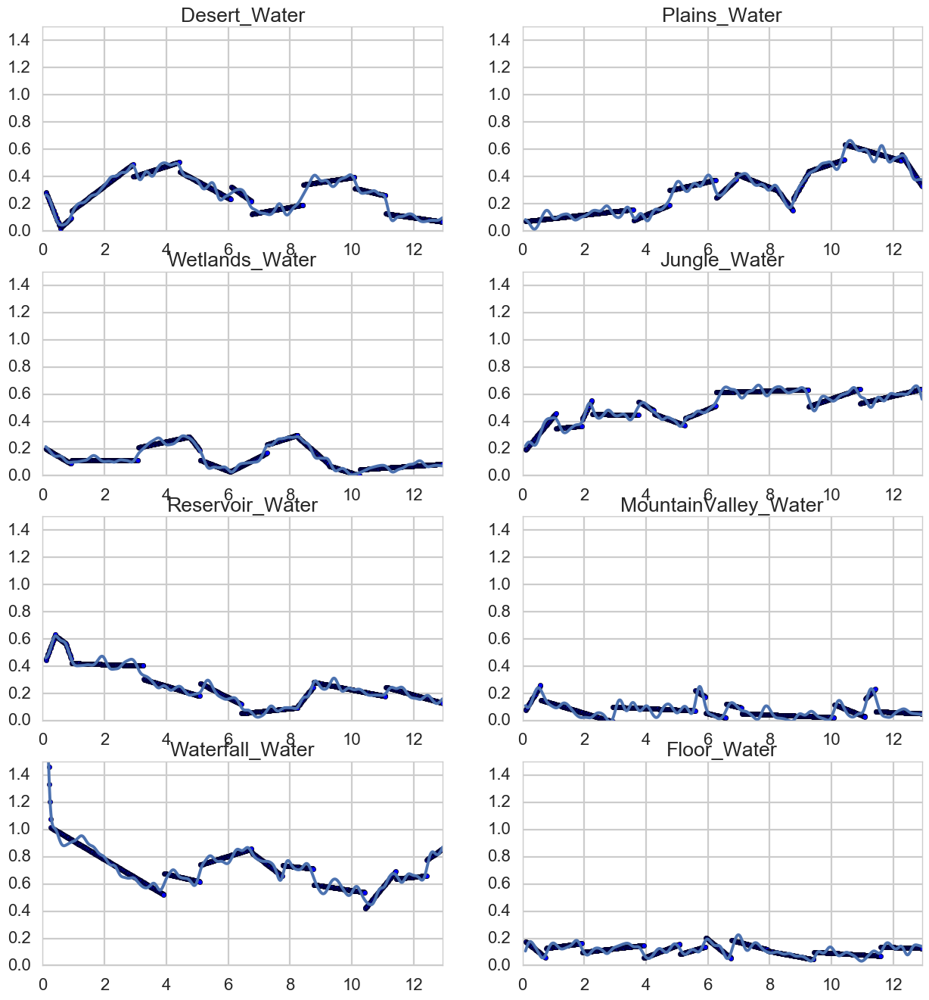

In [88]:
best_individual_splitpoints = [
    8, #D
    8, #P
    8, #W
    8, #J
    8, #R
    8, #MV
    8, #WF
    8] #F

fig, axes = plt.subplots(4,2, figsize=(15,16))
axes = axes.flatten()

events = plot_best_splits(axes, best_individual_splitpoints, 'df_3')

plt.show()

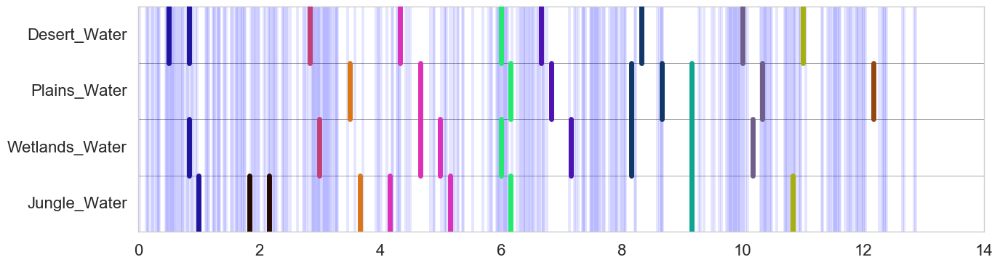

In [89]:
focussed_events = events[-5::-1]

def generate_colour():
    while True:
        yield tuple(np.random.uniform(0,1,3))
        
flat = []
[[flat.append(i) for i in e] for e in focussed_events]
flat = list(np.sort(flat))
difference = np.diff(np.sort(flat))
c_map = generate_colour()
colours = []

for i, d in enumerate(difference):
    if i == 0:
        colours.append(next(c_map))
        
    if d <= 20:
        colours.append(colours[i])
        
    else:
        colours.append(next(c_map))
colours
        
fig, ax = plt.subplots(1,1, figsize=(15,4))
i = 0

for event_log in focussed_events:
    
    ax.axhline(y=i, c='black', lw=0.5, alpha=0.5)
    for e in event_log[:-1]:
                
        ax.axvline(x=e/60, ymin=(i+1)/(len(focussed_events)), ymax=(i)/(len(focussed_events)), c=colours[flat.index(e)], lw=5, zorder=100)
    
    i += 1
    
ax.set_ylim(0,i)
ax.grid(False)

ax.set_yticks(np.arange(0,len(water_columns[:4]))+0.5)
ax.set_yticklabels(water_columns[:4][::-1], position=(0,-1))

for i in data_diffs['df_3']:
    ax.axvline(x=i/60, alpha=0.1)
    
plt.show()

## DF4 - 09-06 - no log movements

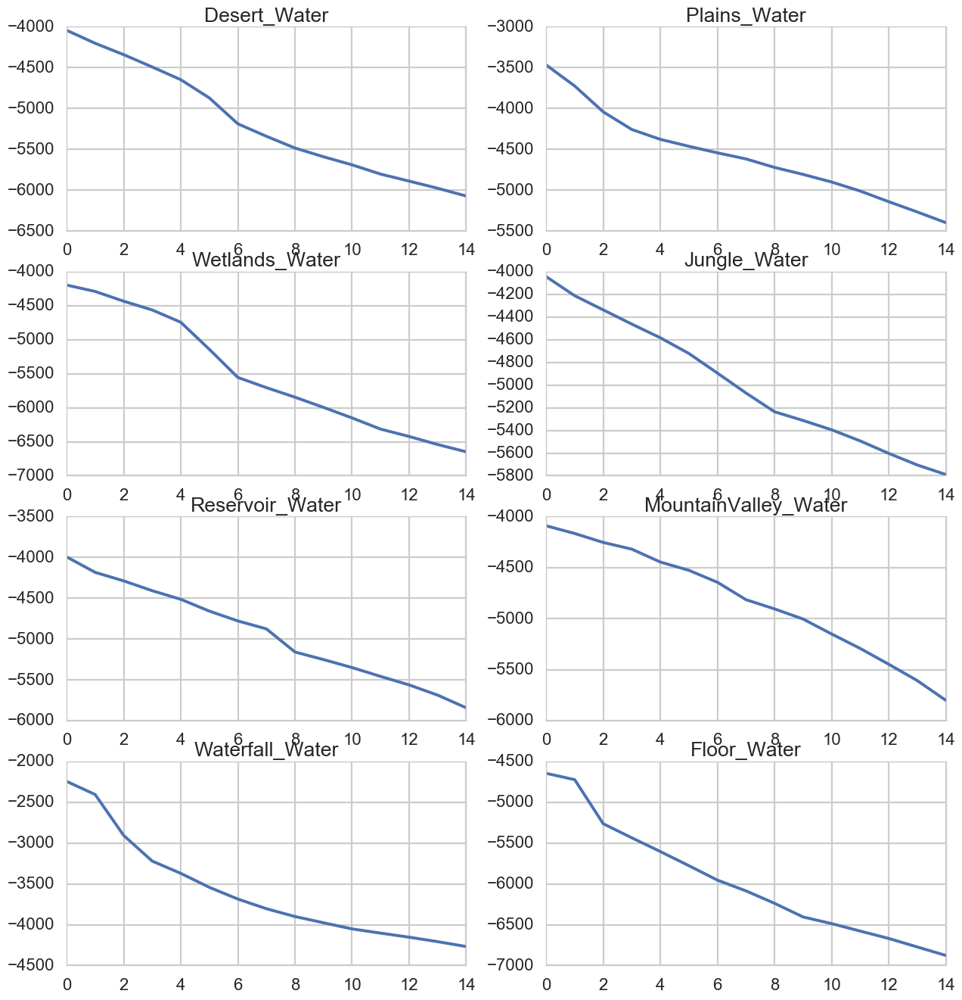

In [80]:
fig, axes = plt.subplots(4,2, figsize=(15,16))
axes = axes.flatten()

signal_data['df_4']['best_splits'] = get_best_split_points_and_plot_BICs(axes, 'df_4')

plt.show()

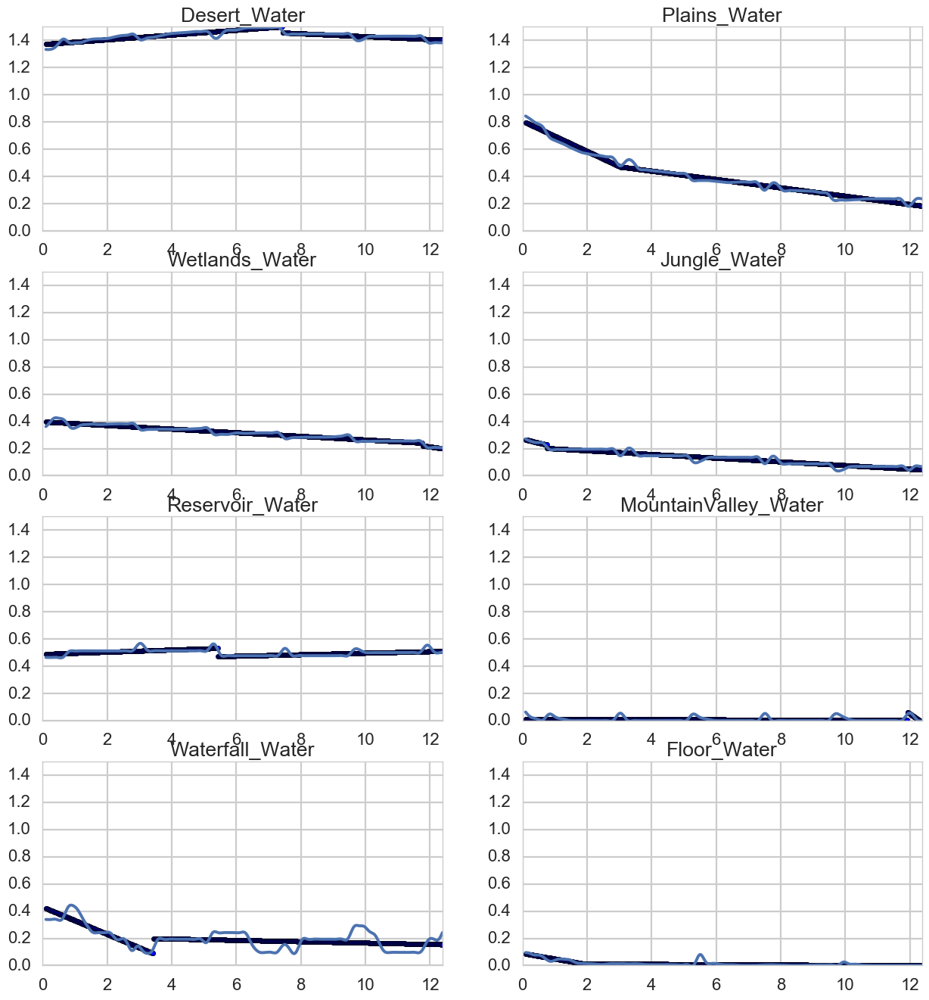

In [81]:
best_individual_splitpoints = [
    0, #D
    0, #P
    0, #W
    0, #J
    0, #R
    0, #MV
    0, #WF
    0] #F

fig, axes = plt.subplots(4,2, figsize=(15,16))
axes = axes.flatten()

events = plot_best_splits(axes, best_individual_splitpoints, 'df_4')

plt.show()

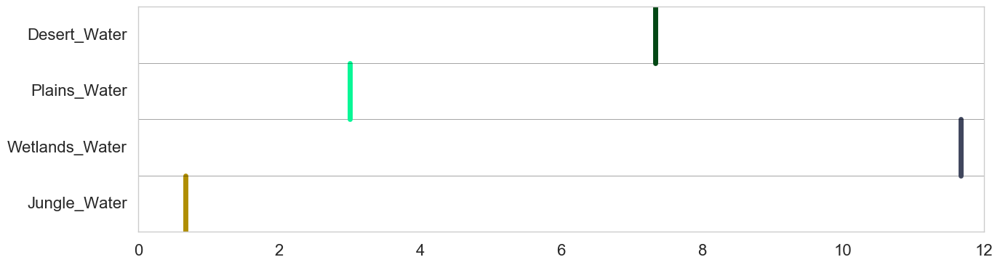

In [82]:
focussed_events = events[-5::-1]

def generate_colour():
    while True:
        yield tuple(np.random.uniform(0,1,3))
        
flat = []
[[flat.append(i) for i in e] for e in focussed_events]
flat = list(np.sort(flat))
difference = np.diff(np.sort(flat))
c_map = generate_colour()
colours = []

for i, d in enumerate(difference):
    if i == 0:
        colours.append(next(c_map))
        
    if d <= 20:
        colours.append(colours[i])
        
    else:
        colours.append(next(c_map))
colours
        
fig, ax = plt.subplots(1,1, figsize=(15,4))
i = 0

for event_log in focussed_events:
    
    ax.axhline(y=i, c='black', lw=0.5, alpha=0.5)
    for e in event_log[:-1]:
                
        ax.axvline(x=e/60, ymin=(i+1)/(len(focussed_events)), ymax=(i)/(len(focussed_events)), c=colours[flat.index(e)], lw=5)
    
    i += 1
    
ax.set_ylim(0,i)
ax.grid(False)

ax.set_yticks(np.arange(0,len(water_columns[:4]))+0.5)
ax.set_yticklabels(water_columns[:4][::-1], position=(0,-1))

for i in data_diffs['df_4']:
    ax.axvline(x=i/60, alpha=0.1)
    
plt.show()